<a href="https://colab.research.google.com/github/yongkgu/Computer_Vision/blob/main/Filtering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive 
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


## **– Average filtering**

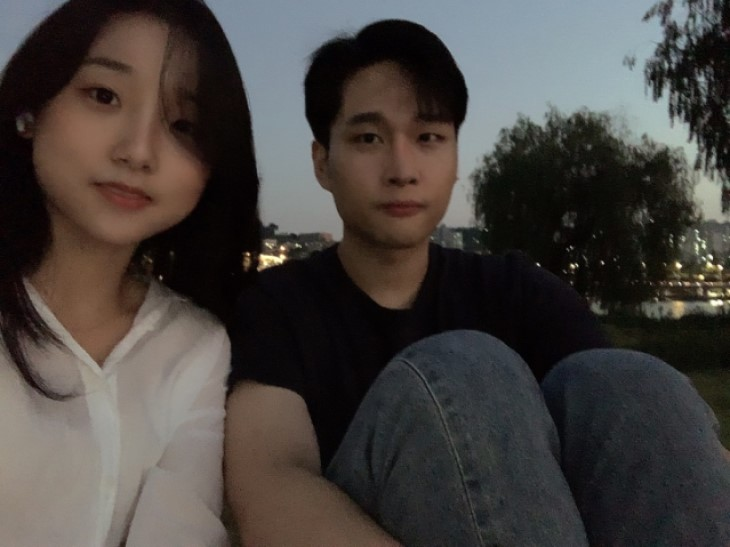

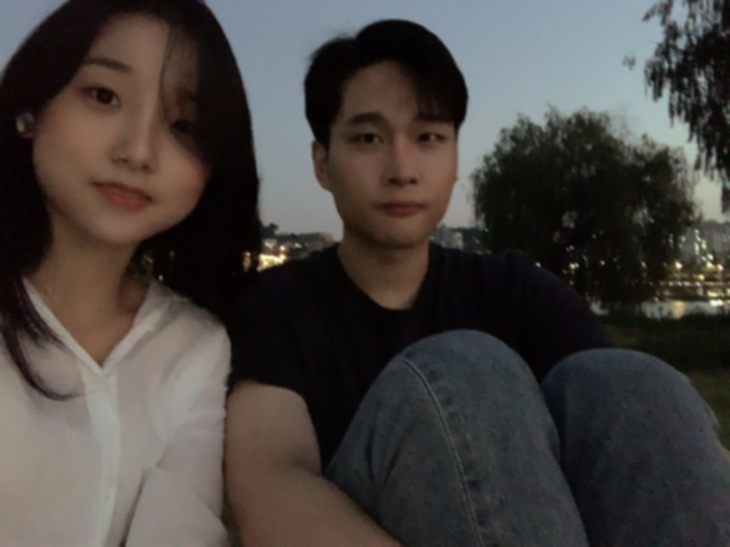

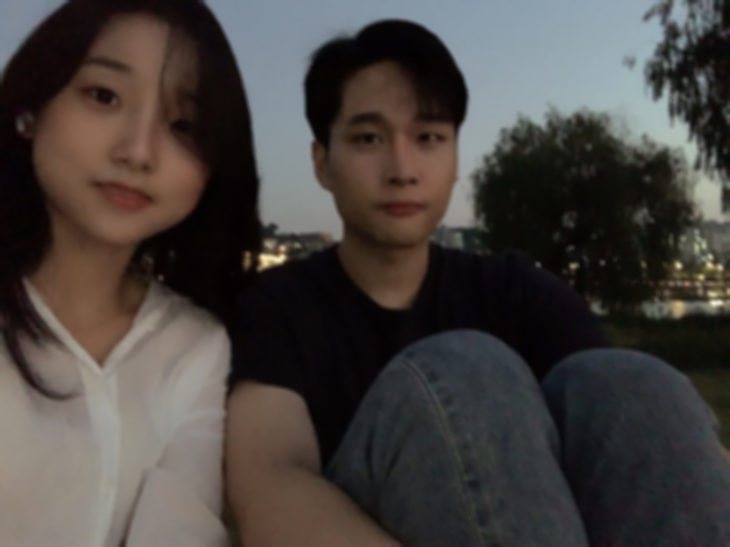

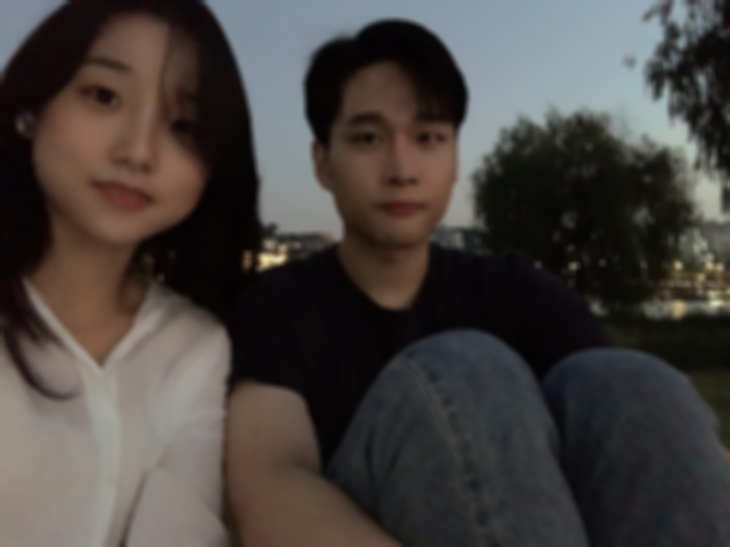

In [ ]:
import cv2 as cv
from google.colab.patches import cv_imshow
img = cv.imread('/content/gdrive/MyDrive/MachineVision/happy.jpg')
blur3 = cv.blur(img, ksize=(3,3)) # 커널 사이즈 3
blur5 = cv.blur(img, ksize=(5,5)) # 커널 사이즈 5
blur7 = cv.blur(img, ksize=(7,7)) # 커널 사이즈 7
# 출력
cv_imshow(img)
cv_imshow(blur3)
cv_imshow(blur5)
cv_imshow(blur7)

## **Image shapeneing**

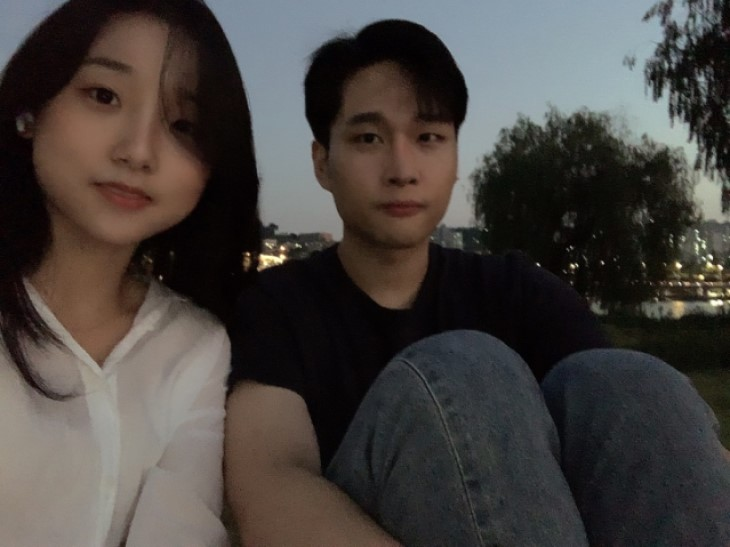

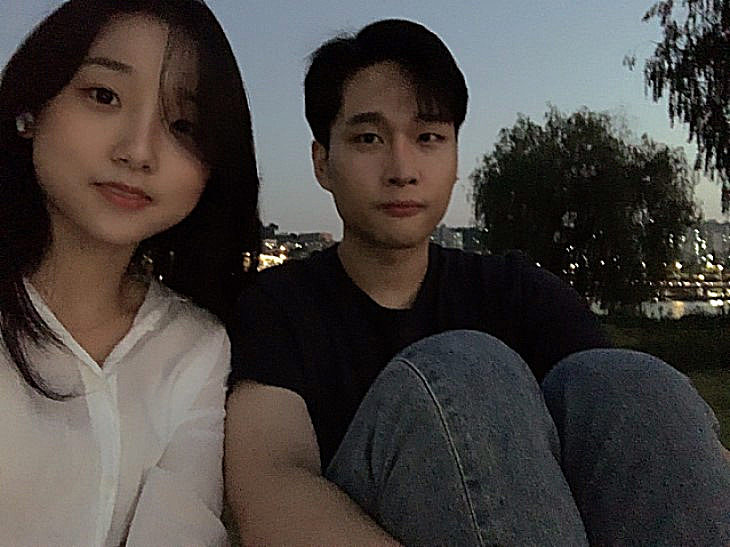

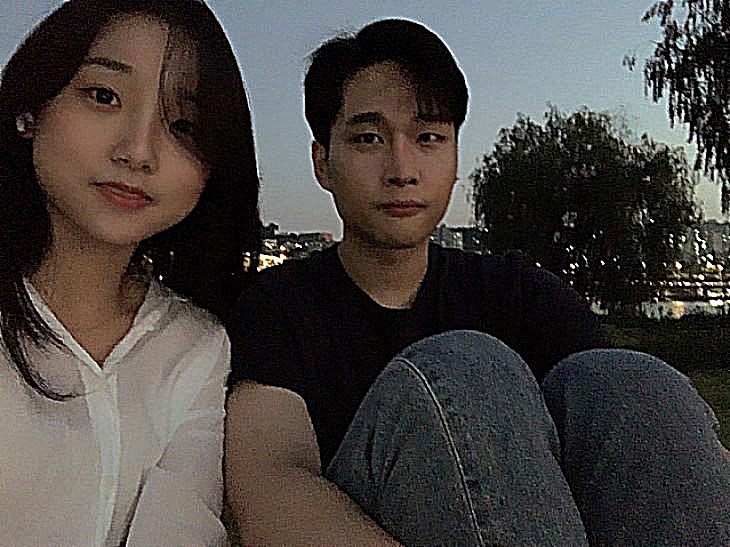

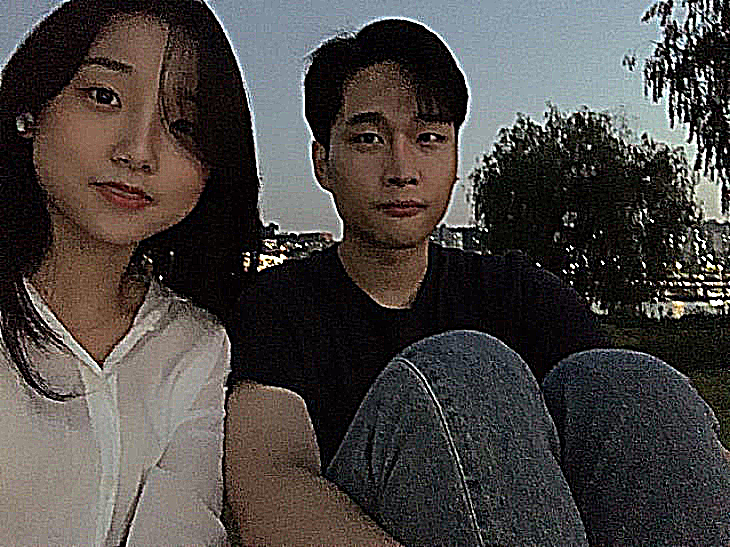

In [ ]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv_imshow

img = cv.imread('/content/gdrive/MyDrive/MachineVision/happy.jpg') #이미지 업로드
blur = cv.blur(img, ksize=(5,5)) #블러 5*5 커널
detail = np.int32(img) - np.int32(blur) # img - blur 하여 디테일 만들기 (unsign int 8이 아닌 int 32로 처리 [0~255 보다 더 많은 수 처리 위해])
shapened_img2 = np.int32(img) + 2*detail #시그마 값 (2) * 디테일 곱한 값을 원본 이미지에 더해 샤프닝 이미지 완성
shapened_img5 = np.int32(img) + 5*detail #시그마 값 (5)
shapened_img10 = np.int32(img) + 10*detail #시그마 값 (10)
cv_imshow(img) #원본 이미지
cv_imshow(shapened_img2) # 샤프닝된 이미지
cv_imshow(shapened_img5)
cv_imshow(shapened_img10)

## **1D Gaussian filter**

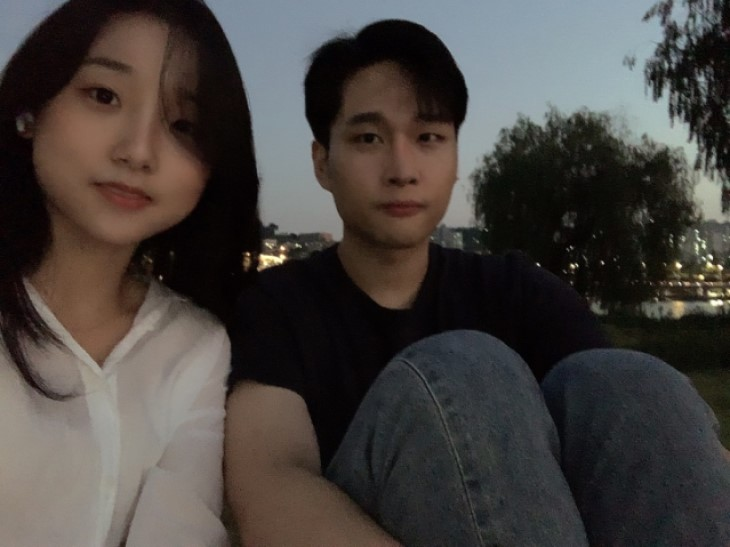

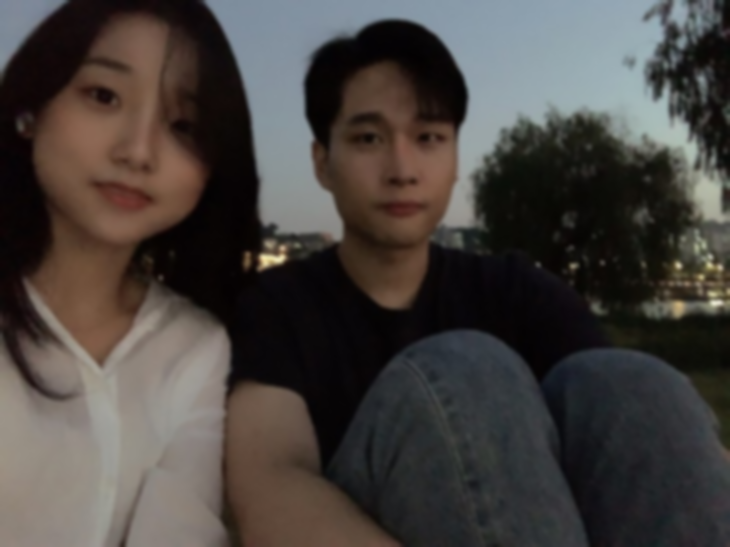

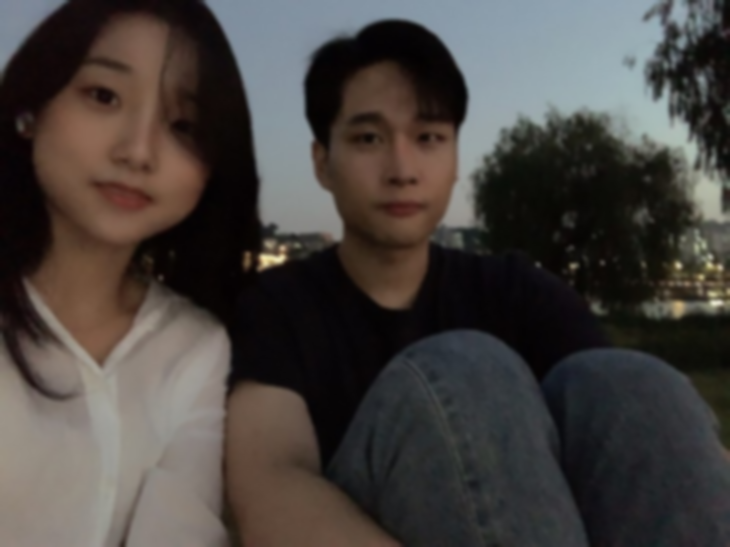

In [ ]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv_imshow
img = cv.imread('/content/gdrive/MyDrive/MachineVision/happy.jpg') #이미지 업로드

kernel1d	=	cv.getGaussianKernel(7, 2) #길이 7, 시그마 2
kernel2d = np.outer(kernel1d, kernel1d.transpose()) # 2d 커널 생성
output_img2d	=	cv.filter2D(img,-1,kernel2d) #2d 필터링

# separable filtering
output_img1 = cv.filter2D(img,-1,kernel1d) #1d 필터링
output_img2 = cv.filter2D(output_img1,-1,kernel1d.transpose()) #1d 필터링 위에 추가로 전치된 1d 필터 이미지로 separable filtering 수행

#출력
cv_imshow(img)
cv_imshow(output_img2d) 
cv_imshow(output_img2) 


## **출력 결과 분석**
2D 가우시안 필터링을 진행한 결과와 separable filtering을 수행한 결과가 같다.

## **median filter**

In [ ]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv_imshow

def addsaltandpeppernoise(image,ratio):  #솔트앤 패퍼 노이즈 만들어주는 함수 (영상,솔트앤패퍼 비율)
  row,col,ch = image.shape # 영상크기 불러오기
  out = np.copy(image) #원본 영상 카피
  # Salt mode
  num_salt = np.ceil(image.size * ratio) # 영상 픽셀 수에 래이쇼 곱한값 만큼 솔트 노이즈 생성
  coords = [np.random.randint(0, i - 1, int(num_salt)) for i in image.shape] # 노이즈 위치 랜덤 설정
  out[coords] = 255 # 하얀색 노이즈
  # Pepper mode
  num_pepper = np.ceil(image.size * ratio)
  coords = [np.random.randint(0, i - 1, int(num_pepper)) for i in image.shape]
  out[coords] = 0 # 검은색 노이즈
  return out

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  # This is added back by InteractiveShellApp.init_path()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  from ipykernel import kernelapp as app


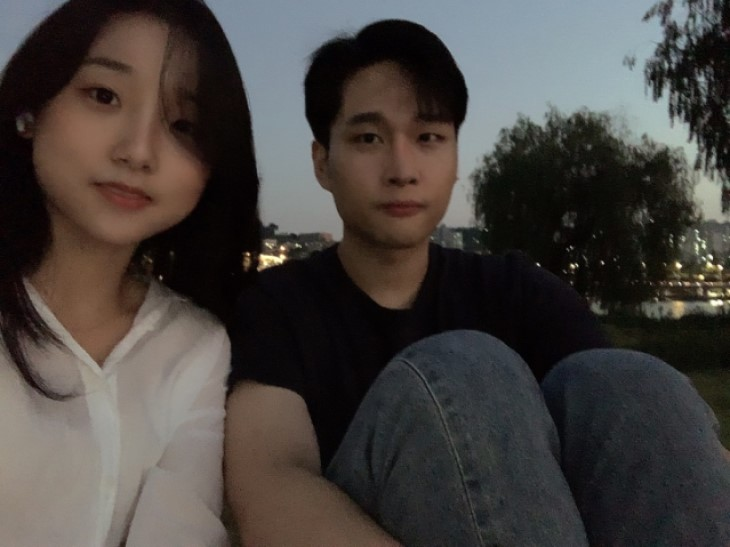

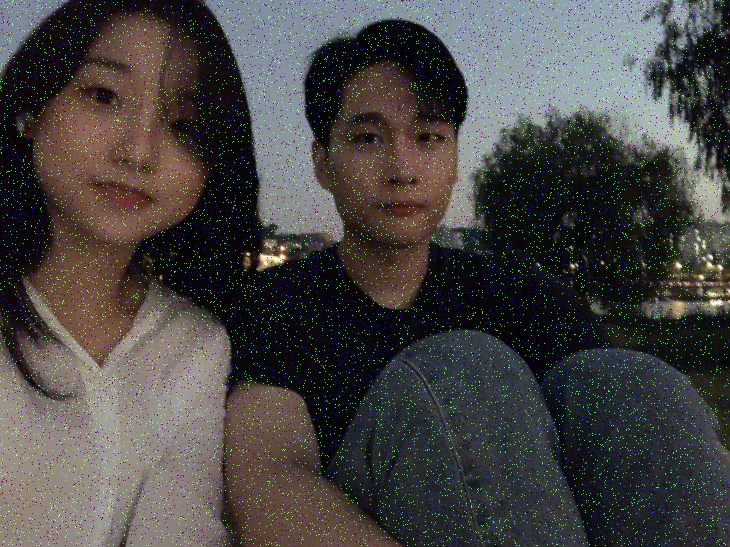

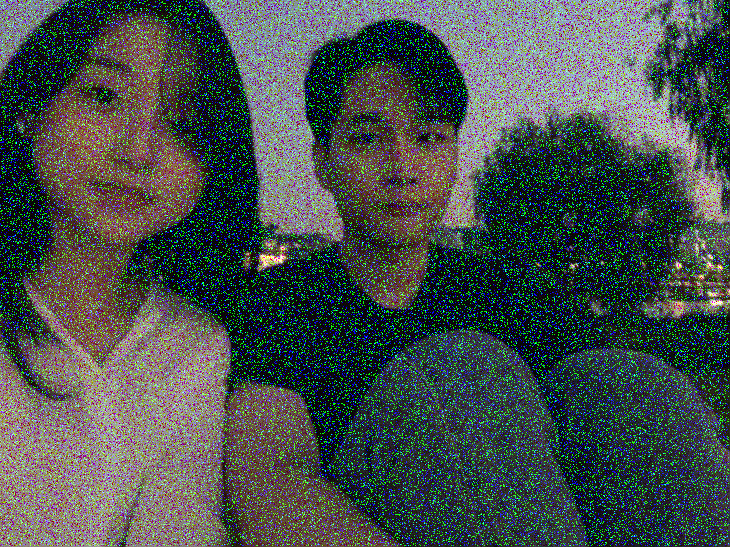

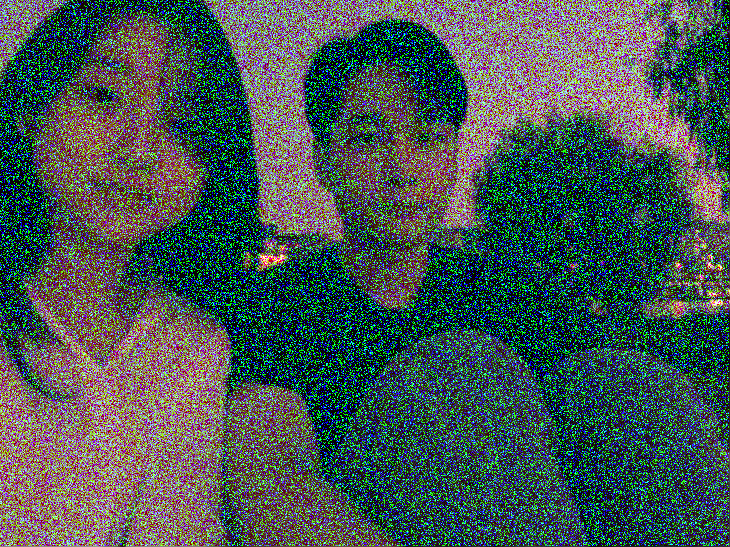

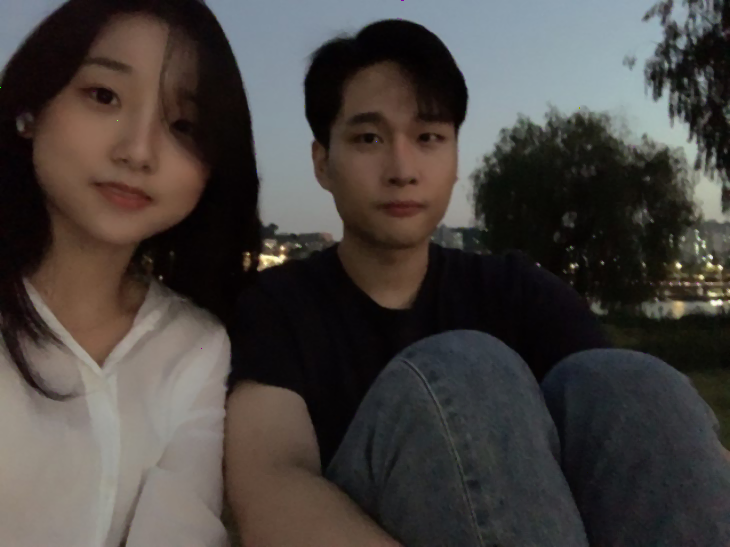

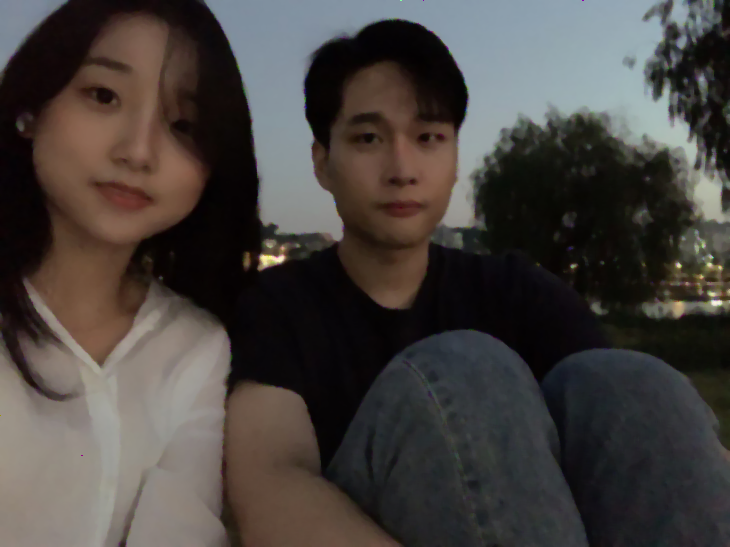

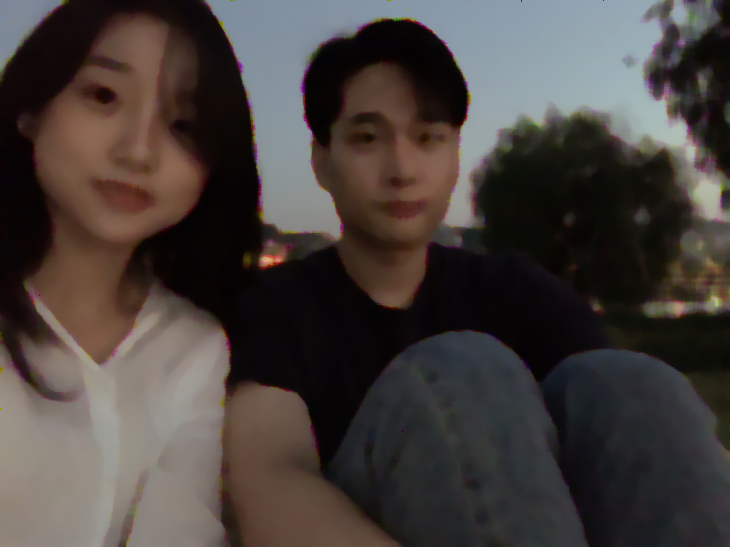

In [ ]:
img = cv.imread('/content/gdrive/MyDrive/MachineVision/happy.jpg') #영상 불러오기
 
img1 = addsaltandpeppernoise(img, ratio=0.02) #만든 함수에 0.02 적용
img2 = addsaltandpeppernoise(img, ratio=0.1) #만든 함수에 0.1 적용
img3 = addsaltandpeppernoise(img, ratio=0.25) #만든 함수에 0.25 적용

median_img_pre1 = cv.medianBlur(img1, ksize=1) #미디언 필터 수행 (이미지, 커널 크기 1)
median_img_pre2 = cv.medianBlur(img2, ksize=1) #미디언 필터 수행 (이미지, 커널 크기 1)
median_img_pre3 = cv.medianBlur(img3, ksize=1) #미디언 필터 수행 (이미지, 커널 크기 1)

median_img1 = cv.medianBlur(img1, ksize=3) #미디언 필터 수행 (이미지, 커널 크기 3)
median_img2 = cv.medianBlur(img2, ksize=5) #미디언 필터 수행 (이미지, 커널 크기 5)
median_img3 = cv.medianBlur(img3, ksize=11) #미디언 필터 수행 (이미지, 커널 크기 11)
# 결과
# 원본 이미지
cv_imshow(img)
# 솔트앤패퍼 노이즈 이미지
cv_imshow(median_img_pre1)
cv_imshow(median_img_pre2)
cv_imshow(median_img_pre3)

# 미디안 필터 수행 후 이미지
cv_imshow(median_img1)
cv_imshow(median_img2)
cv_imshow(median_img3)


## **분석 결과**
 ratio가 클 수록 median filter의 사이즈가 커야 filtering이 잘 수행된다.

## **Practice – Gradients**

In [ ]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv_imshow

img = cv.imread('gdrive/MyDrive/MachineVision/lanes.bmp',cv.IMREAD_GRAYSCALE) #그레이 스케일로 불러오기

Ix = cv.Sobel(img,ddepth=cv.CV_64F,dx=1,dy=0,ksize=3) #SOBEL필터를 사용하여 미분하여 저장 (X축)
Iy = cv.Sobel(img,ddepth=cv.CV_64F,dx=0,dy=1,ksize=3)
mag = np.sqrt(np.square(Ix) + np.square(Iy)) # 크기 구하기
ori = np.arctan2(Iy,Ix) * 180/np.pi # -180~+180 degrees #미분의 방향 구하기

# For display only
Ix_ = (Ix-Ix.min()) / (Ix.max()-Ix.min()) * 255 #그레이 스케일로 출력하기 위해  가장 작은값은 0 가장 큰 값은 255로 바꾸어준다.
Iy_ = (Iy-Iy.min()) / (Iy.max()-Iy.min()) * 255
mag_ = (mag-mag.min()) / (mag.max()-mag.min()) * 255
ori_ = (ori-ori.min()) / (ori.max()-ori.min()) * 255



cv_imshow(Ix_)
cv_imshow(Iy_)
cv_imshow(mag_)
cv_imshow(ori_)

error: ignored

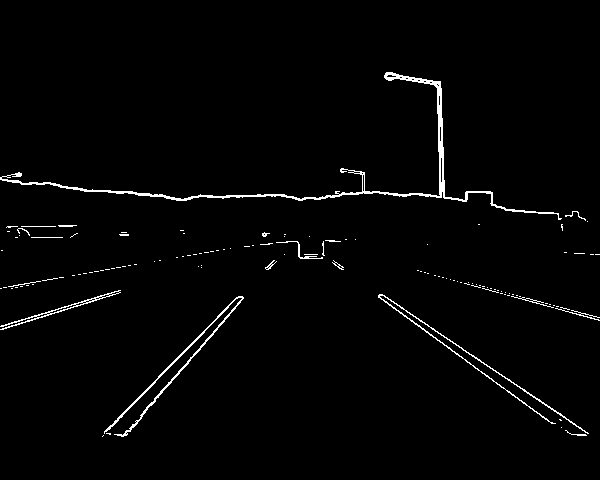

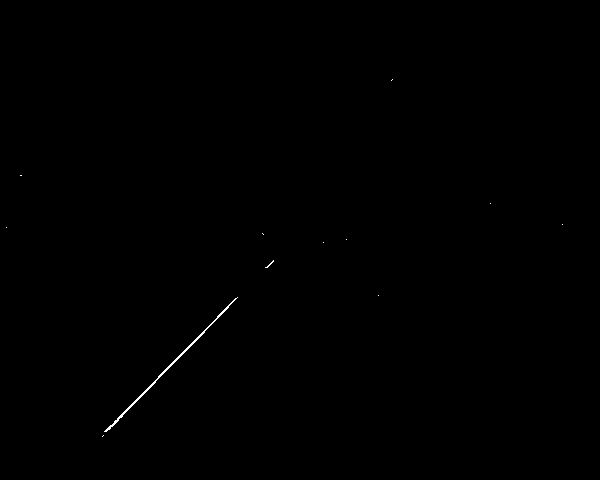

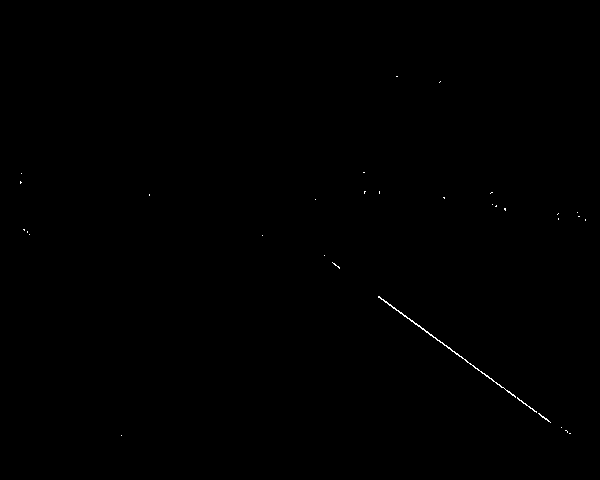

In [ ]:
#바이너리 영상
result1 = np.zeros(img.shape)   #밝기 0으로 채워진 원본 이미지와 같은 크기의 카피 영상
id = np.where(mag>100) #크기가 100이상인 위치
result1[id] = 255 # 그 위치에 255의 밝기를 넣어줌

result2 = np.zeros(img.shape)
id = np.where((mag>100) & (ori>30) & (ori<60)) # 크기 100이상이면서 오리엔테이션이 60과 30 사이의 값
result2[id] = 255

result3 = np.zeros(img.shape)
id = np.where((mag>100) & (ori>-60) & (ori<-30))
result3[id] = 255

cv_imshow(result1)
cv_imshow(result2)
cv_imshow(result3)

## **Practice – Canny edges**

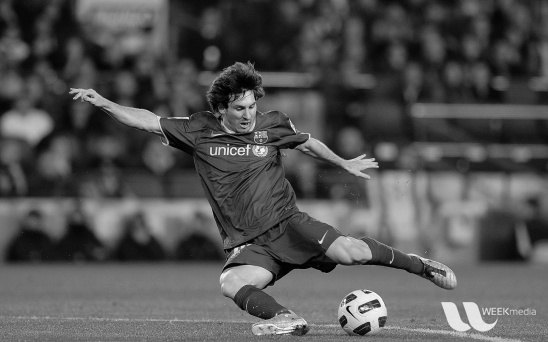

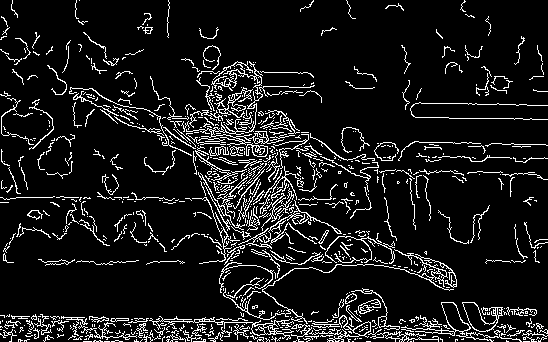

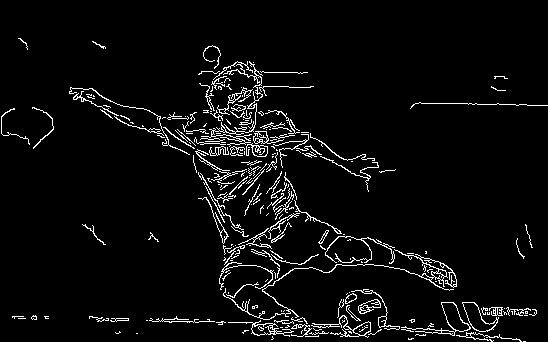

In [ ]:
import cv2 as cv
from google.colab.patches import cv_imshow

img = cv.imread('gdrive/MyDrive/MachineVision/messi5.jpg',0) #그레이 스케일로 불러오기

edges1 = cv.Canny(img,threshold1=50,threshold2=100) #LOW 50 HIGH 100 낮게 사용하면 낮게 사용할 수록 밝기값이 크게 변하지 않는 값도 검출이 됨
edges2 = cv.Canny(img,threshold1=100,threshold2=200)
cv_imshow(img)
cv_imshow(edges1)
cv_imshow(edges2)

## **Practice – Template matching**

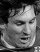

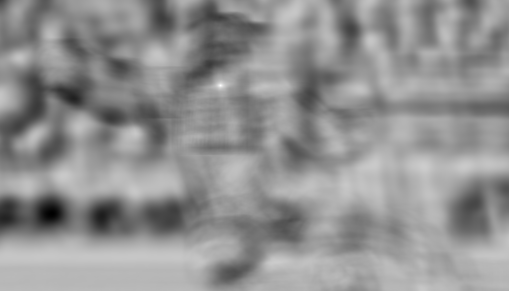

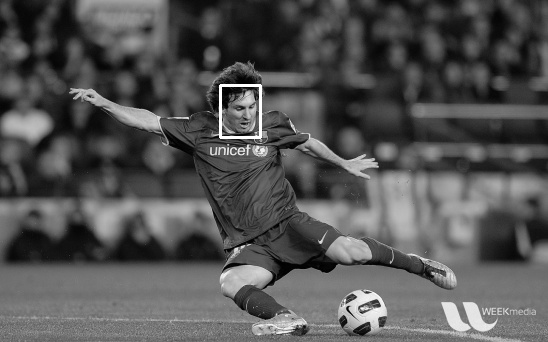

In [ ]:
import cv2 as cv
from google.colab.patches import cv_imshow
img = cv.imread('gdrive/MyDrive/MachineVision/messi5.jpg',0) #영상 불러오기
template = cv.imread('gdrive/MyDrive/MachineVision/template.jpg',0) #템플릿 불러오기
w, h = template.shape[::-1] #템플릿 크기 알아내기
res = cv.matchTemplate(img,template,cv.TM_CCORR_NORMED) #템플릿 찾아내기 NCC 사용
min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res) # 가장 작은 값, 큰 값 위치 알아내기
top_left = max_loc # 가장 큰 값의 위치 저장
bottom_right = (top_left[0] + w, top_left[1] + h) # 위치
cv.rectangle(img, top_left, bottom_right, 255, 2) #사각형 그리기
res_ = (res-res.min()) / (res.max()-res.min()) * 255 # NCC 값 0과 255로 바꾸어 출력

cv_imshow(template)
cv_imshow(res_)
cv_imshow(img)

## **Practice – LS-based line fitting**


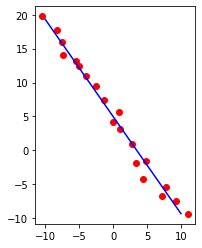

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
def f(x,a,b):
  return a*x+b
a, b = -1.5, 5
x = np.linspace(-10, 10, 20)
y = f(x,a,b)
xn = x + 0.5*np.random.normal(size=len(x))
yn = y + 0.5*np.random.normal(size=len(y))
An = np.vstack([xn, np.ones(len(xn))]).T
abn = np.dot(np.linalg.inv(np.dot(An.T, An)), np.dot(An.T, yn))
#abn = np.polyfit(xn, yn, 1)
plt.plot(xn, yn, 'or')
plt.plot(x, f(x,abn[0],abn[1]), '-b')
plt.gca().set_aspect('equal')
plt.show()


## **Practice – RANSAC line fitting**

[-1.64079657  4.97333595]
[-10.          -8.94736842  -7.89473684  -6.84210526  -5.78947368
  -4.73684211  -3.68421053  -2.63157895  -1.57894737  -0.52631579
   0.52631579   1.57894737   2.63157895   3.68421053   4.73684211
   5.78947368   6.84210526   7.89473684   8.94736842  10.        ]
[ 20.          18.42105263  16.84210526  15.26315789  13.68421053
  12.10526316  10.52631579   8.94736842   7.36842105   5.78947368
   4.21052632   2.63157895   1.05263158  -0.52631579  -2.10526316
  -3.68421053  -5.26315789  -6.84210526  -8.42105263 -10.        ]


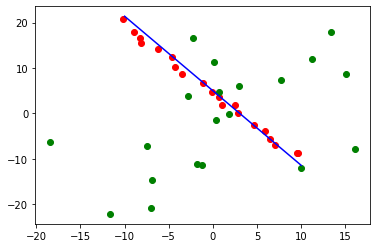

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
def f(x,a,b):
  return a*x+b
def ransac_line_fiting(x,y,r,t):
  iter = np.round(np.log(1-0.999) / np.log(1-(1-r)**2) + 1)
  num_max = 0
  for i in np.arange(iter):
    id = np.random.permutation(len(x))
    xs = x[id[:2]]
    ys = y[id[:2]]
    A = np.vstack([xs, np.ones(len(xs))]).T
    ab = np.dot(np.linalg.inv(np.dot(A.T, A)), np.dot(A.T, ys))
    dist = np.abs(ab[0]*x-y+ab[1])/np.sqrt(ab[0]**2+1)
    numInliers = sum(dist < t)
    if numInliers > num_max:
      ab_max = ab
      num_max = numInliers
    return ab_max, num_max
    
a, b = -1.5, 5
x = np.linspace(-10, 10, 20)
y = f(x,a,b)
xn = x + 0.5*np.random.normal(size=len(x))
yn = y + 0.5*np.random.normal(size=len(y))
xo = 10*np.random.normal(size=len(x))
yo = 10*np.random.normal(size=len(x))
xno = np.concatenate((xn,xo))
yno = np.concatenate((yn,yo))
abno, max = ransac_line_fiting(xno,yno,0.5,2)
print(abno)
print(x)
print(y)
plt.plot(xn, yn, 'or')
plt.plot(xo, yo, 'og')
plt.plot(x, f(x,abno[0],abno[1]), '-b')
#plt.gca().set_aspect('equal')
plt.show()

## **Practice – Hough Transform**

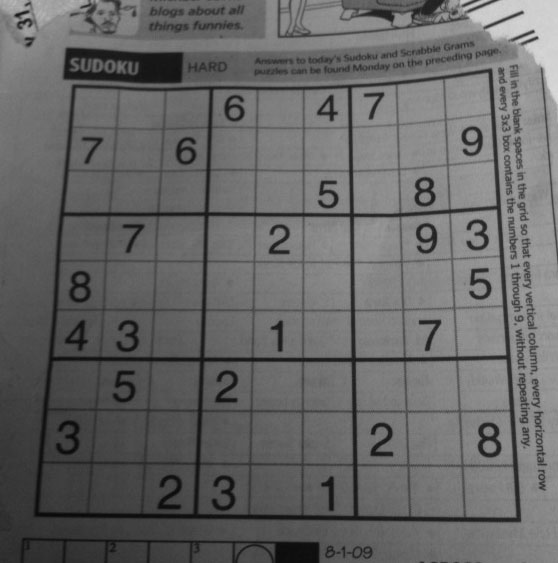

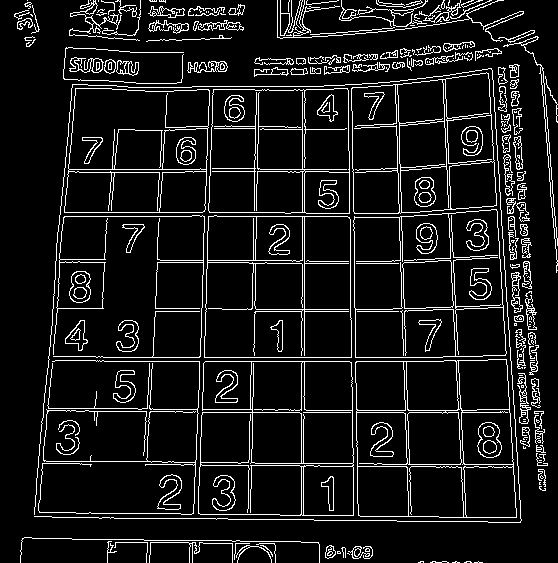

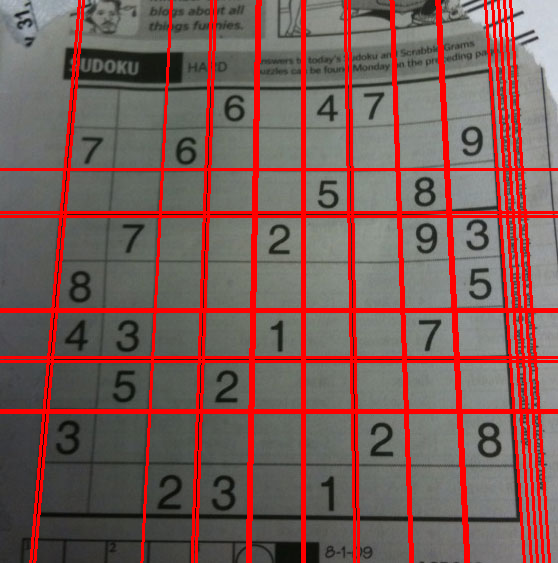

In [ ]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv_imshow
img = cv.imread('gdrive/MyDrive/MachineVision/sudoku.png')
gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
edges = cv.Canny(gray,50,150)
lines = cv.HoughLines(image=edges,rho=1,theta=np.pi/180,threshold=200)
for line in lines:
  rho,theta = line[0]
  cosine = np.cos(theta); sine = np.sin(theta)
  x0 = rho*cosine; y0 = rho*sine
  vec0 = [-sine,cosine]; vec1 = [sine,-cosine]
  x1 = int(x0 + 1000*vec0[0])
  y1 = int(y0 + 1000*vec0[1])
  x2 = int(x0 + 1000*vec1[0])
  y2 = int(y0 + 1000*vec1[1])
  cv.line(img,(x1,y1),(x2,y2),(0,0,255),2)
cv_imshow(gray)
cv_imshow(edges)
cv_imshow(img)
